# Graph Analysis

## Setting up

In [2]:
import ipywidgets as widgets
import pandas as pd 
import datetime
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import colorsys
import itertools
import igraph as ig
import networkx as nx
import gc


In [3]:
REFERENCE_TIMESTAMP = datetime.datetime( 2022, 4, 1, 0, 0, 0)
COLOR_COUNTS=[16,24,32]
WIDGETS = True

In [12]:
df = pd.read_csv('2022_place_canvas_history_cleared.csv', sep=',')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160353085 entries, 0 to 160353084
Data columns (total 5 columns):
 #   Column       Dtype  
---  ------       -----  
 0   pixel_color  object 
 1   user_id_num  int64  
 2   time         float64
 3   X            int64  
 4   Y            int64  
dtypes: float64(1), int64(3), object(1)
memory usage: 6.0+ GB


In [4]:
df['user_id_num'] = df['user_id_num'].astype('int32')
df['X'] = df['X'].astype('int32')
df['Y'] = df['Y'].astype('int32')
df['time'] = df['time'].astype('float32')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160353085 entries, 0 to 160353084
Data columns (total 5 columns):
 #   Column       Dtype  
---  ------       -----  
 0   pixel_color  object 
 1   user_id_num  int32  
 2   time         float32
 3   X            int32  
 4   Y            int32  
dtypes: float32(1), int32(3), object(1)
memory usage: 3.6+ GB


In [5]:
# get rid of final canvas clearing
indices_valid = df['pixel_color']!= '#FFFFFF'
last_valid_index = indices_valid.where(indices_valid).last_valid_index()
df = df.head(last_valid_index+1 )

In [6]:
# Use Color for determining time of canvas expansion
# time = df.loc[df['pixel_color'] == unique_colors[COLOR_COUNTS[0]]]['time'].min()
# short_df = df[df['time'] < time]
# short_df.info()
# time

## Explore Colors

In [4]:
def color_hex_to_rgb(color):
    R = int(color[1:3],16)/255
    G = int(color[3:5],16)/255
    B = int(color[5:7],16)/255
    return (R,G,B)

def color_hex_to_hsv(color):
    (R,G,B) = color_hex_to_rgb(color)
    return colorsys.rgb_to_hsv(R,G,B)

def color_distance(color_1 , color_2, **kwargs):
    weights = kwargs.get('weights',np.array([1,1,1]))
    return np.sqrt(np.sum(((np.array(color_1)-np.array(color_2))*weights)**2))

def color_distance_from_hex(hex_to_desired, hex_color_1 , hex_color_2, **kwargs):
    return color_distance(hex_to_desired(hex_color_1), hex_to_desired(hex_color_2), **kwargs)

In [5]:
def get_color_diff_matrix( unique_colors, color_distance=color_distance, **kwargs):
    color_diff = np.zeros((len(unique_colors),len(unique_colors)))
    for i,c1 in enumerate(unique_colors):
        for j,c2 in enumerate(unique_colors):
            color_diff[i,j]= color_distance( c1, c2, **kwargs)
    return color_diff
        

In [6]:
def plot_similar_colors_update(color_difference_matrix, colors_rgb, save = False, **kwargs):
    np.fill_diagonal(color_difference_matrix,False)
    c = [colors_rgb[cond] for cond in color_difference_matrix]
    c = np.array(list(itertools.zip_longest(*c, fillvalue=[0.5,0.5,0.5])))
    c = np.vstack([[colors_rgb],c]) if len(c)>0 else np.array([colors_rgb])
    plt.figure(figsize=(12,8))
    plt.axis("off")
    plt.title("{} :threshold= {} , weights = {}".format( 
                kwargs.get('metric','Parameters'),
                round(kwargs.get('threshold',np.nan),2),
                kwargs.get('weights',np.nan) 
        ))
    plt.imshow(c)
    if save:
        plt.savefig("selected_color.png")
    plt.show()


def plot_similar_color(colors, hex_to_color_metric, sliders=True, save = False,  **kwargs):
    metric = kwargs.get('metric',['W0','W1','W2'])
    unique_rgb = np.array([color_hex_to_rgb(c) for c in colors])
    colors_typed = np.array([hex_to_color_metric(c) for c in colors])
    def update( threshold, w0, w1, w2):
        weights = np.array([w0, w1, w2])
        color_difference_matrix = get_color_diff_matrix(colors_typed , weights = weights)
        plot_similar_colors_update(color_difference_matrix < threshold , unique_rgb, threshold = threshold, weights = weights,  **kwargs)
    epsilon = 0.01
    if (WIDGETS and sliders):
        return widgets.interact( update, 
            threshold = widgets.FloatSlider(min = 0, max = np.sqrt(3)+epsilon, step = epsilon/10, value=0.5, description='Threshold'),
            w0 = widgets.FloatSlider(min = 0, max = 1, step = epsilon, value=1, description=metric[0]+' Weight:'),
            w1 = widgets.FloatSlider(min = 0, max = 1, step = epsilon, value=1, description=metric[1]+' Weight:'),
            w2 = widgets.FloatSlider(min = 0, max = 1, step = epsilon, value=1, description=metric[2]+' Weight:')
        )
    else:
        threshold = kwargs.get('threshold',0)
        weights = kwargs.get('weights',np.array([1,1,1]))
        kwargs['weights'] = weights
        color_difference_matrix = get_color_diff_matrix(colors_typed , weights = weights)
        plot_similar_colors_update(color_difference_matrix < threshold , unique_rgb, save, **kwargs)
        

In [16]:
unique_colors = df['pixel_color'].unique()
sort_idx = np.argsort(np.array([color_hex_to_hsv(c)[0] for c in unique_colors]))
unique_colors = unique_colors[sort_idx]

In [7]:
unique_colors = np.load('colors.npy', allow_pickle=True)

In [8]:
plot_similar_color(unique_colors, color_hex_to_rgb, metric = 'RGB')

interactive(children=(FloatSlider(value=0.5, description='Threshold', max=1.7420508075688772, step=0.001), Flo…

<function __main__.plot_similar_color.<locals>.update(threshold, w0, w1, w2)>

In [9]:
plot_similar_color(unique_colors, color_hex_to_hsv, metric = 'HSV')

interactive(children=(FloatSlider(value=0.5, description='Threshold', max=1.7420508075688772, step=0.001), Flo…

<function __main__.plot_similar_color.<locals>.update(threshold, w0, w1, w2)>

In [14]:
metric = 'HSV'
T,Hw,Sw,Vw = 0.09, 0.75, 0.25, 0.25
color_treshold = T
color_weights = np.array([Hw,Sw,Vw])
color_difference_matrix = get_color_diff_matrix(np.array([color_hex_to_hsv(c) for c in unique_colors]), weights = color_weights)

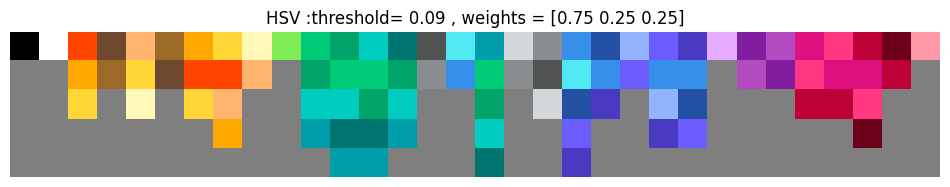

In [68]:
plot_similar_color(unique_colors, color_hex_to_hsv, sliders=False, save = True, threshold = color_treshold, weights = color_weights, metric = metric)

## Data exploration

In [9]:
for column in ['pixel_color','user_id_num']:
    unique_values = df[column].nunique()
    print(f"Column '{column}': {unique_values} unique values")
    
num_rows = df.shape[0]
print(f"Number of entries: {num_rows}")

Column 'pixel_color': 32 unique values
Column 'user_id_num': 10257345 unique values
Number of entries: 155925983


In [12]:
duration_in_seconds = df["time"].max() - df["time"].min()
avrg_placement_delay_sec = duration_in_seconds/df.shape[0]
avrg_placement_delay_per_square_sec = avrg_placement_delay_sec*(df["X"].max()*df["Y"].max())

def sec_to_dhms(duration_in_seconds, round_to=0):
    days = int(duration_in_seconds // 86400)
    hours = int((duration_in_seconds % 86400) // 3600)
    minutes = int((duration_in_seconds % 3600) // 60)
    seconds = round(duration_in_seconds % 60, round_to)
    return (days , hours, minutes, seconds )

d,h,m,s = sec_to_dhms(duration_in_seconds)
print(f"Duration: {duration_in_seconds}s ({d}d {h}h {m}m {s}s)")
print(f"Average placement delay: {round(avrg_placement_delay_sec,5)}s ")
d,h,m,s = sec_to_dhms(avrg_placement_delay_per_square_sec,2)
print(f"Average placement delay per square: {d}d {h}h {m}m {s}s")
time_diff = df["time"].diff()
print(f"Average placement delay: mean = {time_diff.mean():.5f}, std = {time_diff.std():.5f}")

Duration: 295409.875s (3d 10h 3m 30.0s)
Average placement delay: 0.00189s 
Average placement delay per square: 0d 2h 6m 10.63s
Average placement delay: mean = 0.00189, std = 0.04260


In [19]:
df_image = (df
    .groupby(['X','Y']).agg({"time":[lambda x: x.diff().mean() if len(x)>1 else 0,lambda x: x.diff().std() if len(x)>1 else 0,"count"],"pixel_color":"last"})
    .rename(columns={ "count":"count", "<lambda_0>":"mean", "<lambda_1>":"std"})
)#5:30 / NTB 33:00
df_image

time                    pixel_color
                 mean         std  count        last
X    Y                                              
0    0       4.188103    5.913694  70496     #FFFFFF
     1      32.592903   49.170792   9027     #FFFFFF
     2      78.910408  145.269638   3728     #FFFFFF
     3     147.655304  293.777924   1991     #FFFFFF
     4     216.456650  430.943726   1360     #FFFFFF
...               ...         ...    ...         ...
1999 1995  323.365051  647.276245    309     #2450A4
     1996  314.837494  530.900696    316     #2450A4
     1997  147.615570  263.313507    677     #2450A4
     1998   39.922470   56.592995   2500     #3690EA
     1999    3.931183    4.359149  25388     #FFFFFF

[3994958 rows x 4 columns]

In [20]:
df_image.columns = ["_".join(a) for a in df_image.columns.to_flat_index()]
df_image["count"] = df_image["time_count"]
df_image = df_image.drop(["time_count"], axis=1)
df_image

time                    pixel_color  count
                 mean         std  count        last       
X    Y                                                     
0    0       4.188103    5.913694  70496     #FFFFFF  70496
     1      32.592903   49.170792   9027     #FFFFFF   9027
     2      78.910408  145.269638   3728     #FFFFFF   3728
     3     147.655304  293.777924   1991     #FFFFFF   1991
     4     216.456650  430.943726   1360     #FFFFFF   1360
...               ...         ...    ...         ...    ...
1999 1995  323.365051  647.276245    309     #2450A4    309
     1996  314.837494  530.900696    316     #2450A4    316
     1997  147.615570  263.313507    677     #2450A4    677
     1998   39.922470   56.592995   2500     #3690EA   2500
     1999    3.931183    4.359149  25388     #FFFFFF  25388

[3994958 rows x 5 columns]

In [ ]:
df_image.to_csv( '2022_place_canvas_final_image_statistics.csv', sep=',', index=True)

In [3]:
df_image= pd.read_csv( '2022_place_canvas_final_image_statistics.csv', index_col=[0,1], sep=',')
df_image

time_mean    time_std pixel_color_last  count
X    Y                                                   
0    0       4.188103    5.913690          #FFFFFF  70496
     1      32.592902   49.170939          #FFFFFF   9027
     2      78.910411  145.269704          #FFFFFF   3728
     3     147.655302  293.777666          #FFFFFF   1991
     4     216.456656  430.943550          #FFFFFF   1360
...               ...         ...              ...    ...
1999 1995  323.365078  647.276096          #2450A4    309
     1996  314.837527  530.901807          #2450A4    316
     1997  147.615558  263.313554          #2450A4    677
     1998   39.922472   56.593035          #3690EA   2500
     1999    3.931183    4.359114          #FFFFFF  25388

[3994958 rows x 4 columns]

In [24]:
np_image_color = np.zeros([2000, 2000, 3])
for index, row in df_image.iterrows():
    np_image_color[index]=np.array(color_hex_to_rgb(row['pixel_color_last']))
np_image_color = np.transpose(np_image_color, (1, 0, 2))

In [25]:
np_image_time = np.zeros([2000, 2000])
for index, row in df_image.iterrows():
    np_image_time[index]=row["time_mean"]
np_image_time = np_image_time.T

In [26]:
np_image_count = np.zeros([2000, 2000])
for index, row in df_image.iterrows():
    np_image_count[index]=row["count"]
np_image_count = np_image_count.T

In [28]:
mean_mean_time_per_pixel = df_image["time_mean"].mean()
std_mean_time_per_pixel = df_image["time_mean"].std()
d,h,m,s = sec_to_dhms(mean_mean_time_per_pixel,2)
print(f"Average of mean placement delay per pixel: {mean_mean_time_per_pixel:.2f} s equal to {d}d {h}h {m}m {s}s")
d,h,m,s = sec_to_dhms(std_mean_time_per_pixel,2)
print(f"Standard deviation of mean placement delay per pixel: {std_mean_time_per_pixel:.2f} s equal to {d}d {h}h {m}m {s}s")

Average of mean placement delay per pixel: 9362.799850600268 s equal to 0d 2h 36m 2.8s
Standard deviation of mean placement delay per pixel: 12240.314782051504 s equal to 0d 3h 24m 0.31s


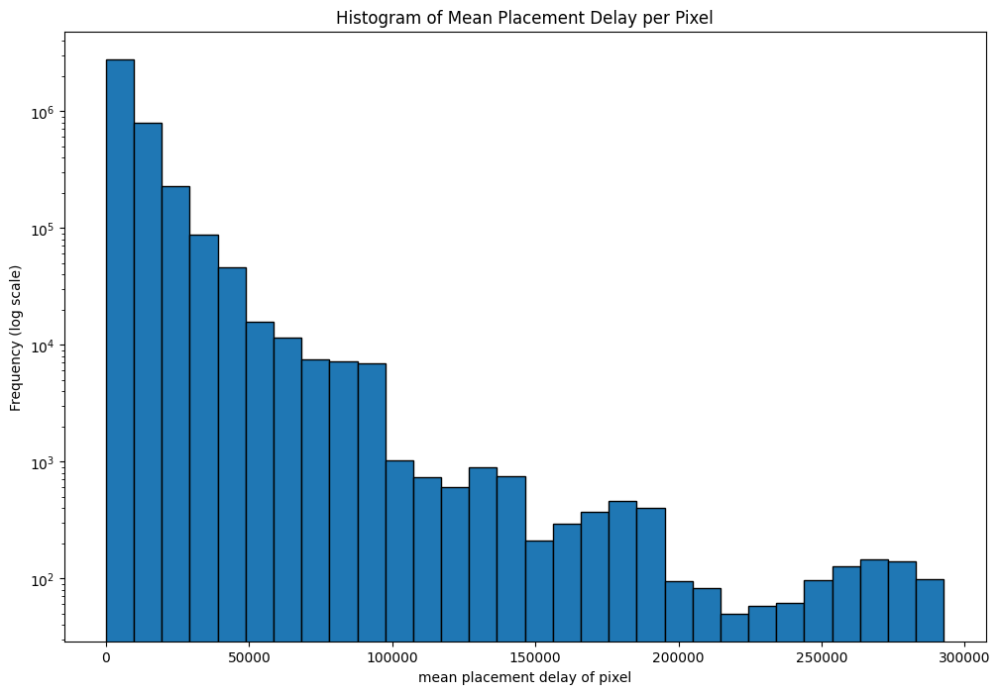

In [5]:
log_scale = True
plt.figure(figsize=(12,8))
plt.hist(df_image["time_mean"], bins=30, edgecolor='black') 

plt.xlabel('Mean placement delay of pixel (s)')
plt.ylabel(f'Frequency {"(log scale)" if log_scale else ""}')
plt.title('Histogram of Mean Placement Delay per Pixel')
if log_scale:
    plt.yscale('log')
    
plt.savefig("histogram_mean_time"+("_log" if log_scale else "")+".png")
plt.show()

In [ ]:
# def image_update(threshold):
#     fig, axs = plt.subplots(4,1,figsize=(20, 80))
    
#     np_image_count_add_one = np_image_count+1
#     ax_0 = axs[0].imshow(np_image_count_add_one,
#         cmap='inferno',
#         norm=colors.LogNorm(
#             vmin=np_image_count_add_one.min(),
#             vmax=np_image_count_add_one.max()
#         )
#     )
#     axs[0].set_title("Image heatmap of placement counts logarithm per pixel")
#     plt.colorbar(ax_0, ax=axs[0])
    
#     ax_1 = axs[1].imshow(np_image_count<=threshold, cmap='Greys')
#     axs[1].set_title("Image of placement counts lover then treshold")
#     plt.colorbar(ax_1)
    
#     np_image_time_zero_to_max = np_image_time
#     np_image_time_zero_to_max[np_image_time_zero_to_max==0] = np.max(np_image_time_zero_to_max)
    
#     # ax_2 = axs[2].imshow(np_image_time, cmap='inferno')
#     # axs[2].set_title("Image heatmap of expected placement delays in seconds per pixel")
#     # plt.colorbar(ax_2)
    
#     ax_2 = axs[2].imshow(np_image_time_zero_to_max,
#         cmap='inferno',
#         norm=colors.LogNorm(
#             vmin=np_image_time_zero_to_max.min(),
#             vmax=np_image_time_zero_to_max.max()
#         )
#     )
#     axs[2].set_title("Image heatmap of logarithm of expected placement delays in seconds per pixel")
#     plt.colorbar(ax_2, ax=axs[2])
    
#     ax_3 = axs[3].imshow(np_image_color, cmap='hsv')
#     axs[3].set_title("Image final state")
#     plt.colorbar(ax_3)
    
#     plt.show()

# if WIDGETS:   
#     widgets.interact(image_update, threshold = widgets.FloatSlider(min = np_image_count.min(), max = np_image_count.max(), step = 1, value=0, description='Threshold'))
# else:
#     image_update(1)

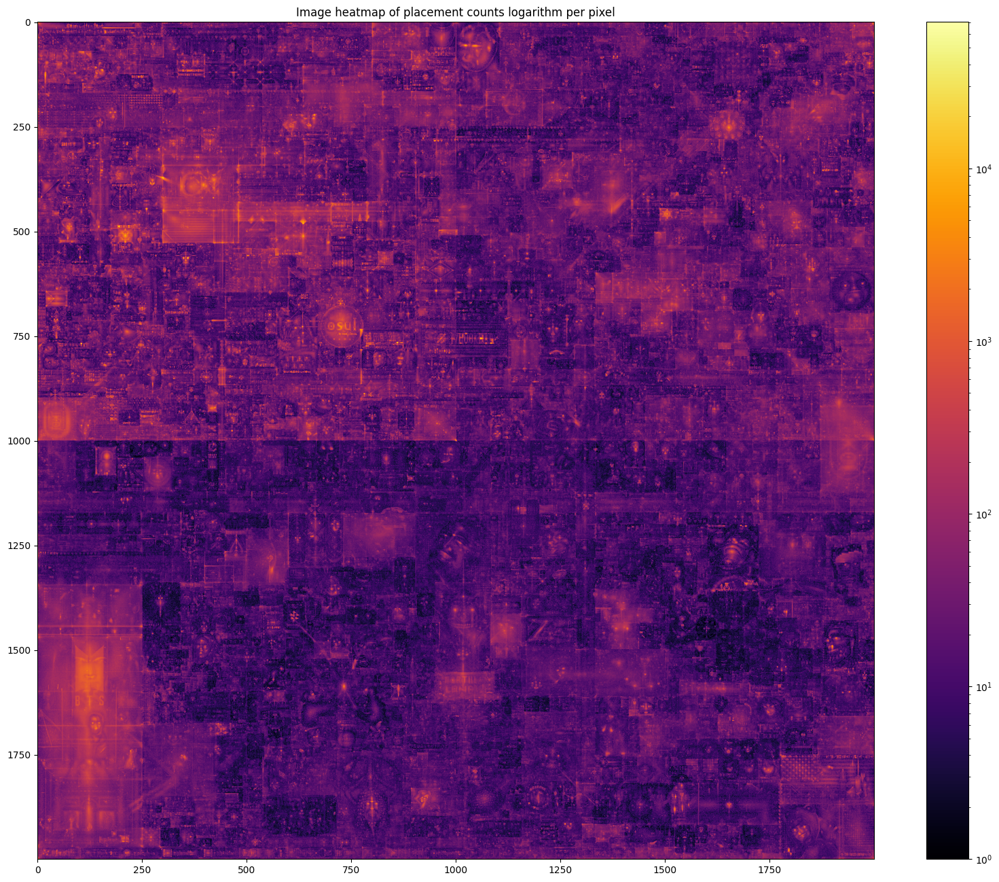

In [32]:
plt.figure(figsize=(20, 16))

np_image_count_add_one = np_image_count+1
plt.imshow(np_image_count_add_one,
    cmap='inferno',
    norm=colors.LogNorm(
        vmin=np_image_count_add_one.min(),
        vmax=np_image_count_add_one.max()
    )
)
plt.title("Image heatmap of placement counts logarithm per pixel")
plt.colorbar()

plt.savefig("Placement_counts.png")
plt.show()


In [38]:
def image_update(threshold):
    plt.figure(figsize=(20, 16))
    plt.imshow(np_image_count<=threshold, cmap='Greys')
    plt.title("Image of placement counts lover then treshold")
    plt.colorbar()
    
if WIDGETS:   
    widgets.interact(image_update, threshold = widgets.FloatSlider(min = np_image_count.min(), max = np_image_count.max(), step = 1, value=0, description='Threshold'))
else:
    count_treshold = 1
    image_update(count_treshold)
    plt.savefig(f"Placement_counts_treshold_{count_treshold}.png")

interactive(children=(FloatSlider(value=0.0, description='Threshold', max=70496.0, step=1.0), Output()), _dom_…

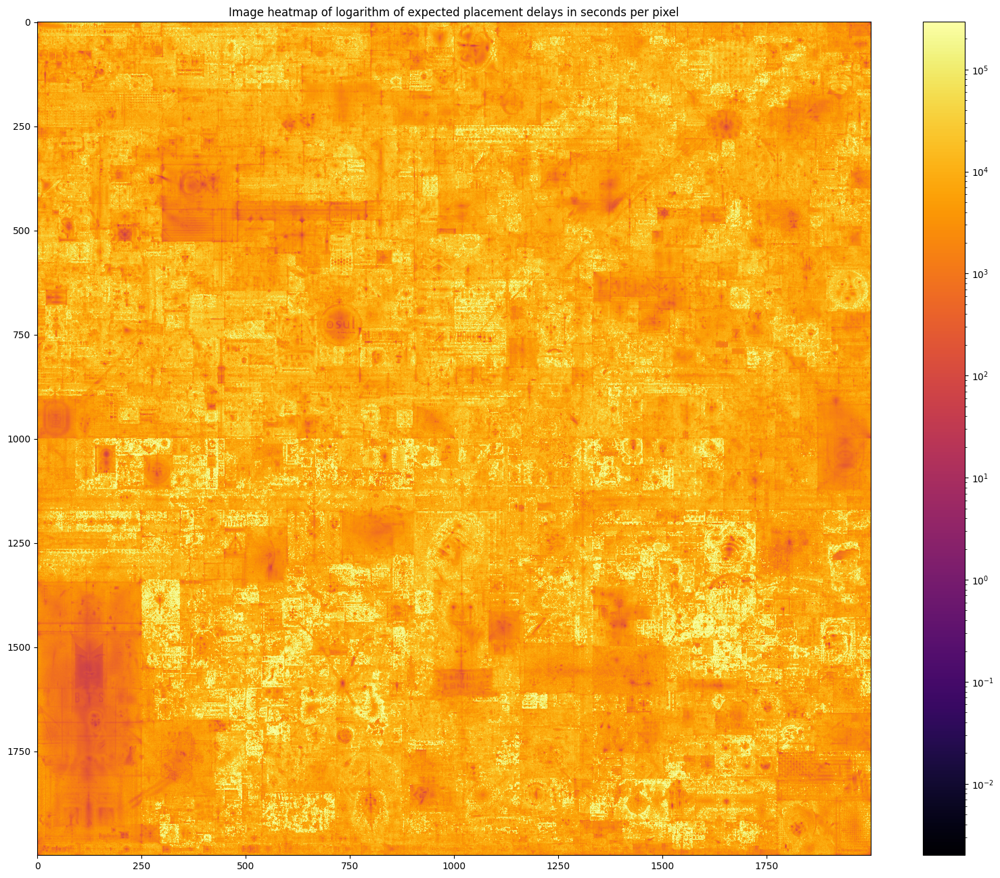

In [47]:
np_image_time_zero_to_max = np_image_time
np_image_time_zero_to_max[np_image_time_zero_to_max==0] = np.max(np_image_time_zero_to_max)

plt.figure(figsize=(20, 16))
plt.imshow(np_image_time_zero_to_max,
    cmap='inferno',
    norm=colors.LogNorm(
        vmin=np_image_time_zero_to_max.min(),
        vmax=np_image_time_zero_to_max.max()
    )
)
plt.title("Image heatmap of logarithm of expected placement delays in seconds per pixel")
plt.colorbar()

plt.savefig("Placement_delays.png")
plt.show()


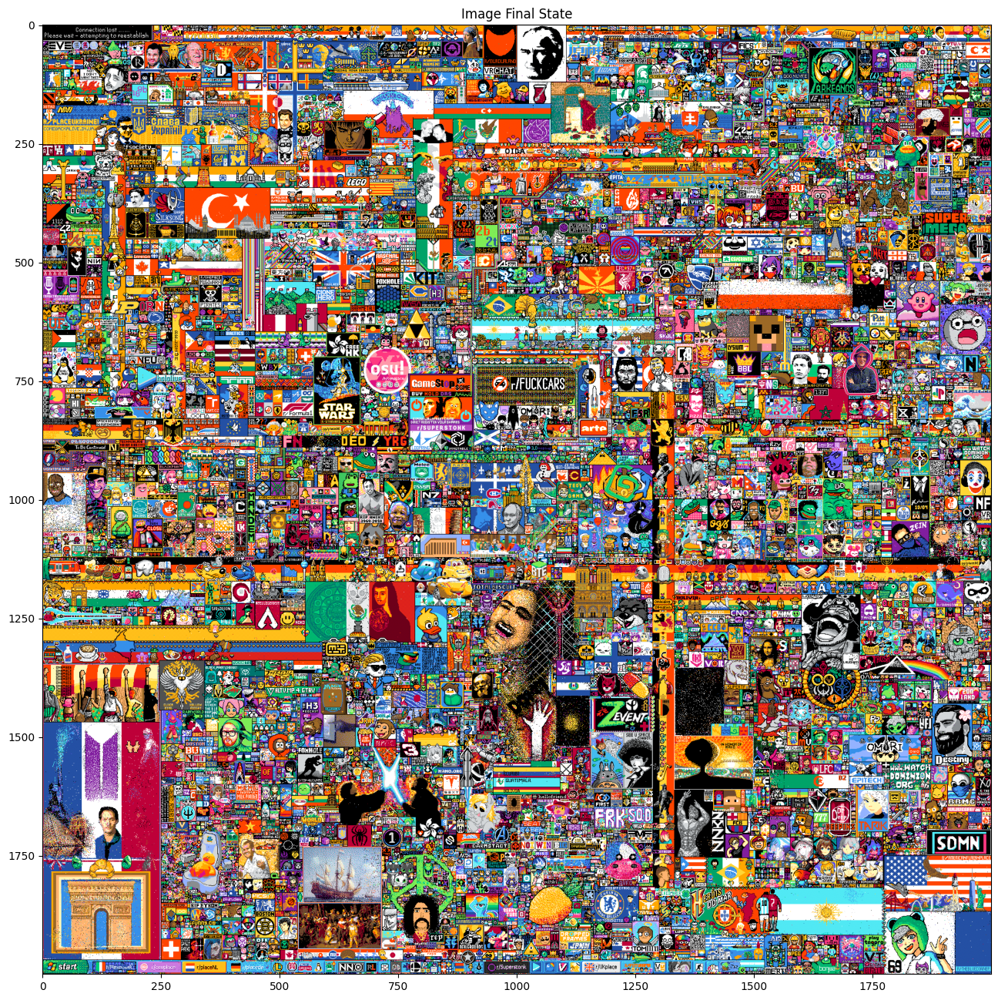

In [50]:
plt.figure(figsize=(20, 16))
plt.imshow(np_image_color, cmap='hsv')
plt.title("Image Final State")

plt.savefig("Final_image.png")
plt.show()

## Preparing for edge computation

In [57]:
color_distance_weight = (color_difference_matrix < color_treshold)*2 -1

In [ ]:
np.save('colors.npy', unique_colors)
np.save('users.npy', df["user_id_num"].unique())
np.savetxt('color_distance_weight.txt', color_distance_weight, fmt='%f')

In [12]:
df['color'] = df['pixel_color'].replace(unique_colors, range(len(unique_colors)))
df = df.drop( ['pixel_color'], axis=1)

In [ ]:
df.to_csv('2022_place_canvas_history_timed.csv', sep=',', index=False)

In [ ]:
df.sort_values(by=['X','Y','time'], ascending=True, inplace=True)
df = df.reset_index(drop=True)
df.to_csv('2022_place_canvas_history_grouped.csv', sep=',', index=False)

## Graph computing

Time for $1 000 000$ entries:

`Python compare ~ (n[['X','Y']]==m[['X','Y']]).all()` - Extremely slow $ \approx 35min$

`Python grouped ~ df.groupby(['X','Y'])` - Takes a long time $ \approx 2min$

`C++ Implementation` - Memory efficient and quick $ \approx 3sec$

In [ ]:
# if (n[['X','Y']]==m[['X','Y']]).all():

In [52]:
df = pd.read_csv('2022_place_canvas_history_grouped.csv', sep=',')

In [ ]:
# c=0
# G = nx.Graph()
# G.add_nodes_from(np.load('users.npy', allow_pickle=True))
# for i in range(len(df)):
#     if  c%10000 == 0:
#         print(c,datetime.datetime.now().strftime("%d-%m-%Y %H:%M:%S"))
#     c +=1
#     n = df.iloc[i]
#     for j in range(max(-5,-i),-1):
#         m = df.iloc[i+j]
#         if (n[['X','Y']]==m[['X','Y']]).all():
#             w = color_distance_weight[int(n['color']),int(m['color'])]
#             if G.has_edge( n['user_id_num'], m['user_id_num']):
#                 G[n['user_id_num']][m['user_id_num']]['weight'] += w
#             else:
#                 G.add_edge( n['user_id_num'], m['user_id_num'], weight=w)
# nx.write_weighted_edgelist(G,"edges_disected/2022_place_graph_edgelist"+str(b)+'.csv',delimiter=',')

In [ ]:
# c=0
# G = nx.Graph()
# G.add_nodes_from(np.load('users.npy', allow_pickle=True))
# for pixel,group in df.groupby(['X','Y']):
#     for i in range(len(group)):
#         if  c%1000000 == 0:
#             print(c,datetime.datetime.now().strftime("%d-%m-%Y %H:%M:%S"))
#         c +=1
#         n = group.iloc[i]
#         for j in range(max(-5,-i),-1):
#             m = group.iloc[i+j]
#             # if (n[['X','Y']]==m[['X','Y']]).all():
#                 #w = (color_distance_from_hex(color_hex_to_hsv,n['pixel_color'], m['pixel_color'],weight=color_weights) < color_treshold)*2-1
#             w = color_distance_weight[int(n['color']),int(m['color'])]
#             if G.has_edge( n['user_id_num'], m['user_id_num']):
#                 G[n['user_id_num']][m['user_id_num']]['weight'] += w
#             else:
#                 G.add_edge( n['user_id_num'], m['user_id_num'], weight=w)
# nx.write_weighted_edgelist(G,"edges_disected/2022_place_graph_edgelist"+str(b)+'.csv',delimiter=',')